<a href="https://colab.research.google.com/github/sainisatish/Assignment_AI_Associate/blob/main/Ball_trackingv2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import glob
import cv2
import time
import csv
import os

In [7]:
dataset = pd.read_csv("/content/drive/MyDrive/Assignment_ball_track/dataset.csv")

In [10]:
image_list = dataset["image_name"]

In [1]:
img_path = "/content/drive/MyDrive/Assignment_ball_track/data/"

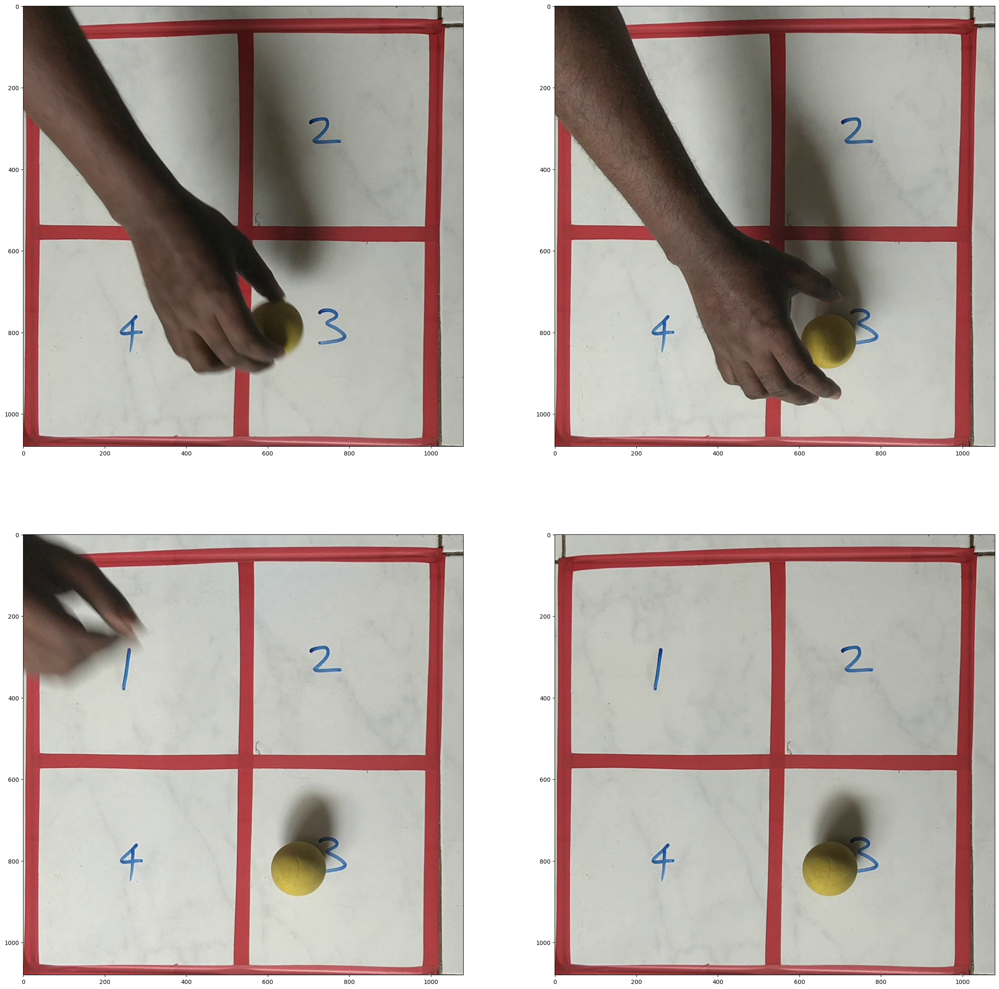

In [11]:
fig = plt.figure(figsize=(30,30))

for i in range(4):
    ax = fig.add_subplot(2,2,i+1)
    img_p = img_path+image_list[i]
    img = plt.imread(img_p)
    img = plt.imshow(img)

In [12]:
target_size = (256,256)

In [14]:
columns = dataset.columns

In [17]:
dataset[columns[:3]]

,x_vlaue,y_value,radius
0,620,786,66
1,672,820,67
2,674,818,68
3,676,818,66
4,674,820,68
...,...,...,...
587,710,214,58
588,720,718,67
589,718,716,67
590,718,718,66


In [62]:
x = dataset[columns[0]]
y = dataset[columns[1]]
r = dataset[columns[2]]

In [63]:
x_value = x - r
y_value = y - r
w_value = x + r
h_value = y + r

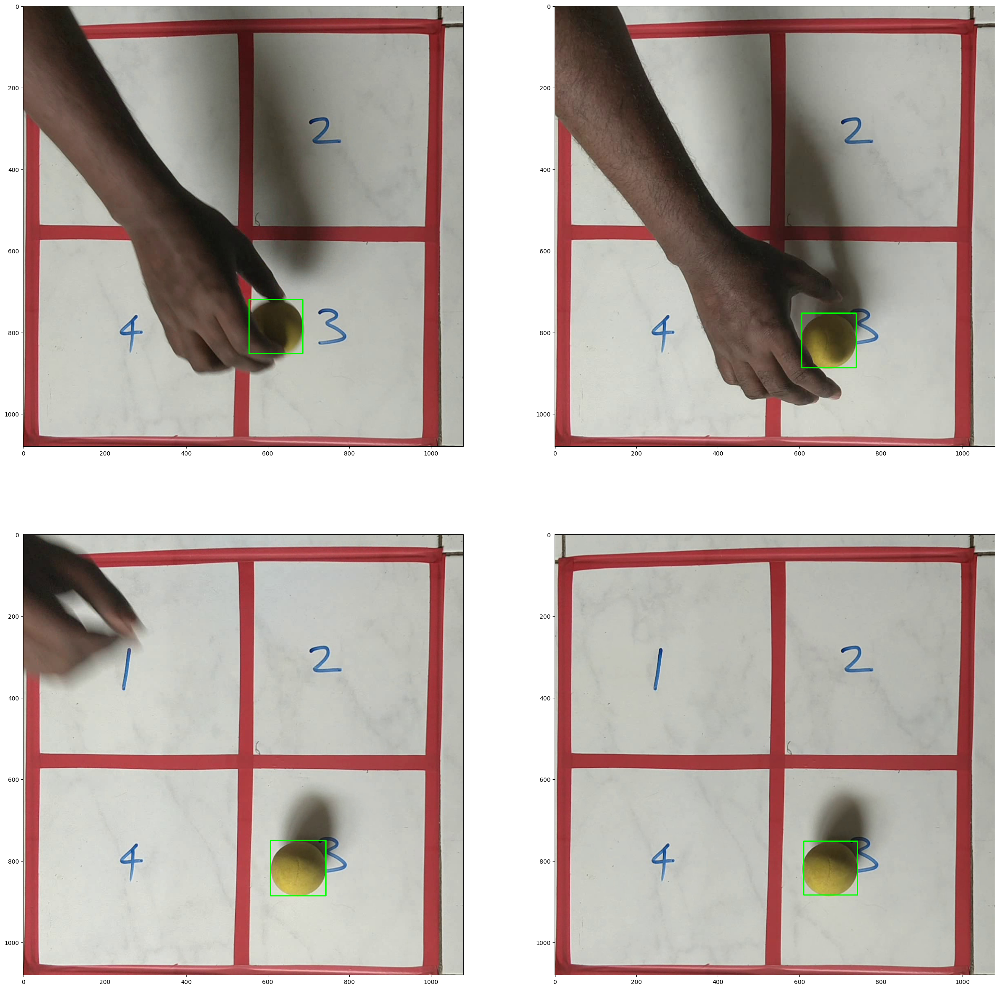

In [37]:
fig = plt.figure(figsize=(30,30))
for i in range(4):
    ax = fig.add_subplot(2,2,i+1)
    img_p = img_path+image_list[i]
    img_p= plt.imread(img_p)
    cv2.rectangle(img_p,(x_value[i],y_value[i]),(w_value[i],h_value[i]),(0,255,0),2)
    img = plt.imshow(img_p)

In [ ]:
from tqdm import tqdm

In [52]:
image_data = []
for i in tqdm(range(len(image_list))):
    img = img_path+image_list[i]
    img = cv2.imread(img,cv2.IMREAD_ANYCOLOR)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img = cv2.resize(img,(256,256))
    image_data.append(img)

In [65]:
x_value = [int(value*0.23703703703) for value in x_value]
y_value = [int(value*0.23703703703) for value in y_value]
w_value = [int(value*0.23703703703) for value in w_value]
h_value = [int(value*0.23703703703) for value in h_value]

In [68]:
data = pd.DataFrame([x_value,y_value,w_value,h_value])

In [70]:
data = data.transpose()

In [74]:
data.columns = ["x_value","y_value","w_value","h_value"]

In [78]:
data.to_csv("dataset256.csv")

In [95]:
data

,x_value,y_value,w_value,h_value
0,131,170,162,201
1,143,178,175,210
2,143,177,175,210
3,144,178,175,209
4,143,178,175,210
...,...,...,...,...
587,154,36,182,64
588,154,154,186,186
589,154,153,186,185
590,154,154,185,185


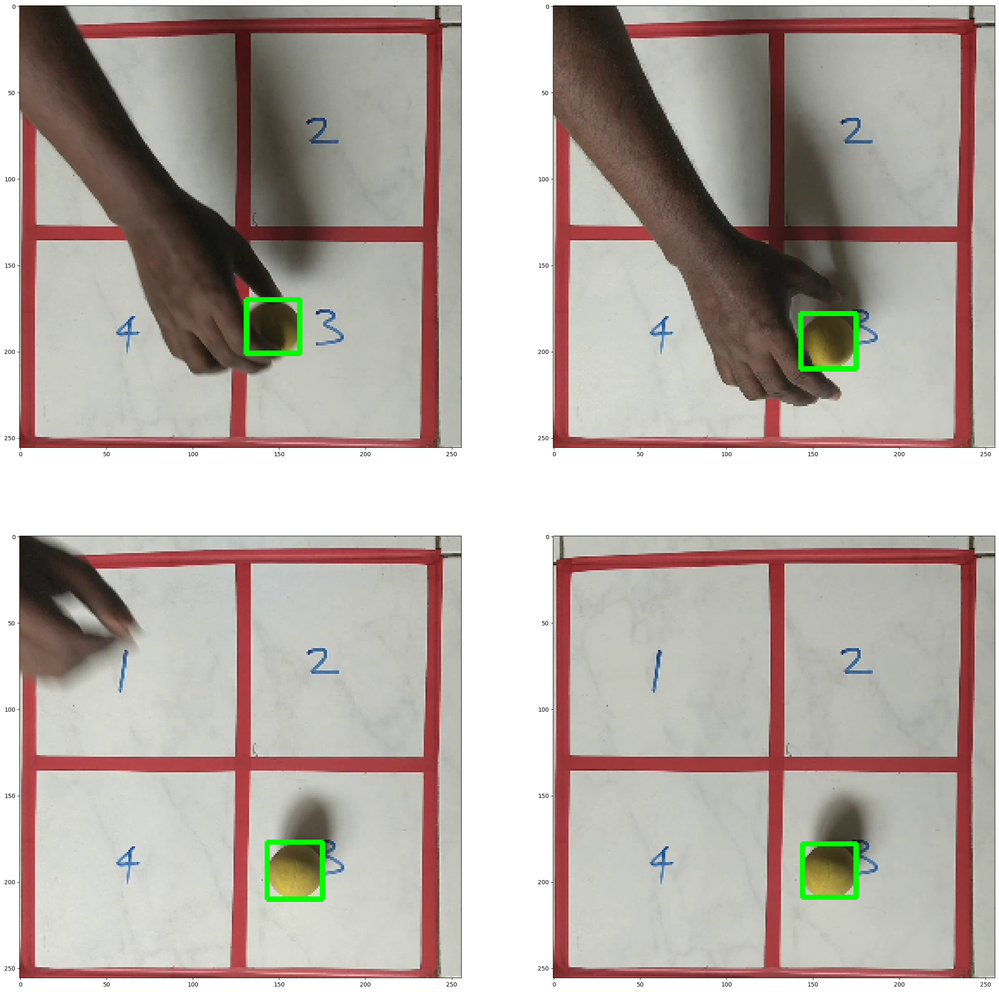

In [113]:
fig = plt.figure(figsize=(30,30))
for i in range(4):
    ax = fig.add_subplot(2,2,i+1)
    img = image_data[i].copy()
    cv2.rectangle(img,(data["x_value"][i],data["y_value"][i]),(data["w_value"][i],data["h_value"][i]),(0,255,0),2)
    img = plt.imshow(img)

In [81]:
vertical_flip_img = []
for img in image_data:
    img = np.flip(img,axis=0)  # filip image vertically
    vertical_flip_img.append(img)

In [124]:
v_labels = data.copy()

In [126]:
v_labels["y_value"] = v_labels["y_value"].apply(lambda x : 256 - x)

In [127]:
v_labels["h_value"] = v_labels["h_value"].apply(lambda x : 256 - x)

In [107]:
aug_labels = np.concatenate((data,v_labels))

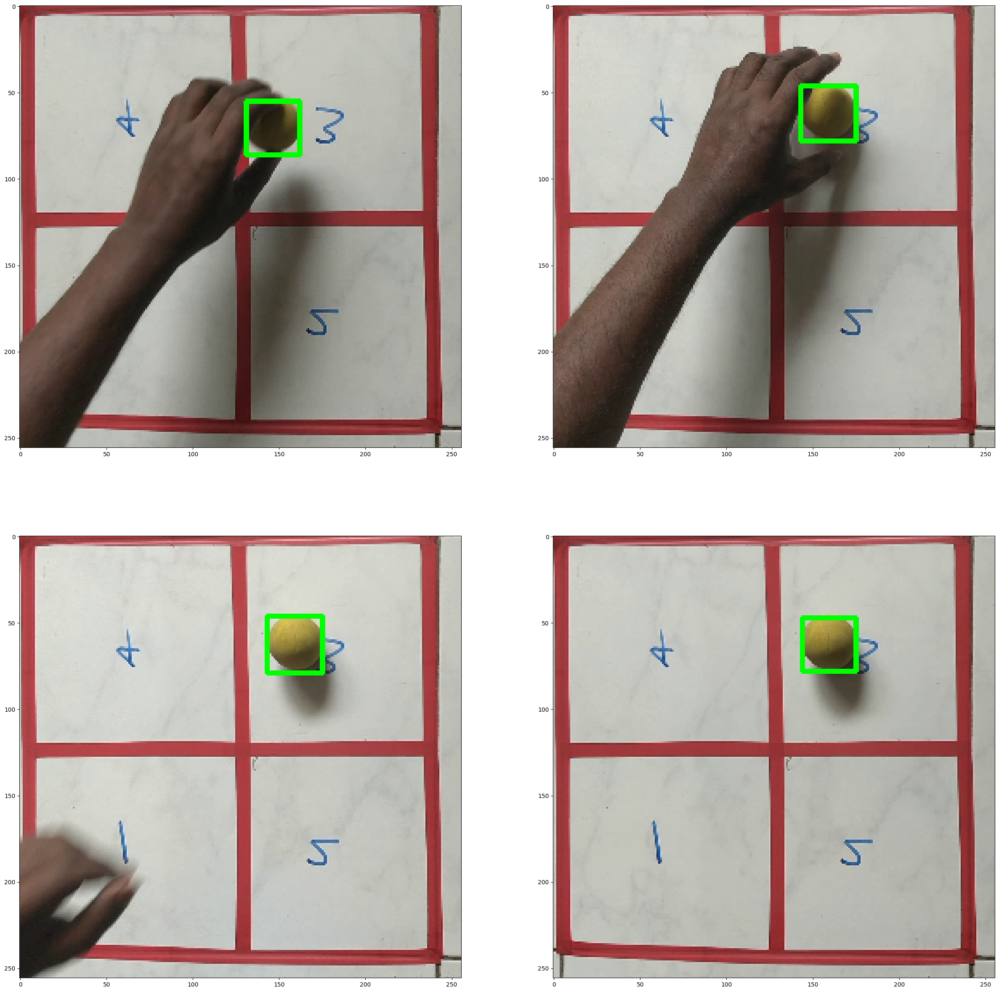

In [128]:
fig = plt.figure(figsize=(30,30))
for i in range(4):
    ax = fig.add_subplot(2,2,i+1)
    img = vertical_flip_img[i].copy()
    cv2.rectangle(img,(v_labels["x_value"][i],v_labels["y_value"][i]),(v_labels["w_value"][i],v_labels["h_value"][i]),(0,255,0),2)
    img = plt.imshow(img)

In [119]:
horizontal_flip_img = []
for img in image_data:
    img = np.flip(img,axis=1)  # filip image vertically
    horizontal_flip_img.append(img)

In [129]:
h_labels = data.copy()

In [130]:
h_labels["x_value"] = h_labels["x_value"].apply(lambda x : 256 - x)
h_labels["w_value"] = h_labels["w_value"].apply(lambda x : 256 - x)

In [132]:
aug_labels = np.concatenate((aug_labels,h_labels))

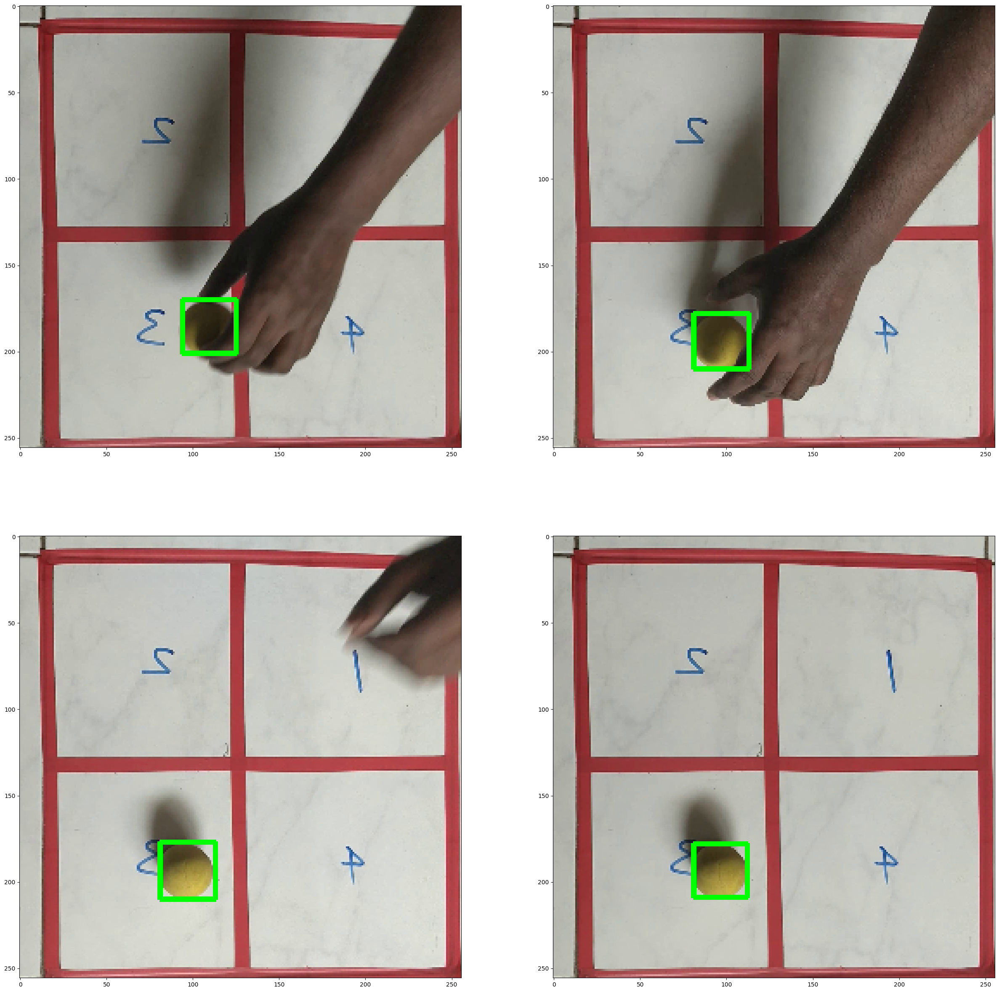

In [131]:
fig = plt.figure(figsize=(30,30))
for i in range(4):
    ax = fig.add_subplot(2,2,i+1)
    img = horizontal_flip_img[i].copy()
    cv2.rectangle(img,(h_labels["x_value"][i],h_labels["y_value"][i]),(h_labels["w_value"][i],h_labels["h_value"][i]),(0,255,0),2)
    img = plt.imshow(img)

In [133]:
import random

In [137]:
bright_img = []
for img in image_data:
    img = np.clip(random.uniform(1,2)*img,0.0,255.0)  # filip image vertically
    img = img.astype("uint8")
    bright_img.append(img)

In [140]:
aug_labels = np.concatenate((data,aug_labels))

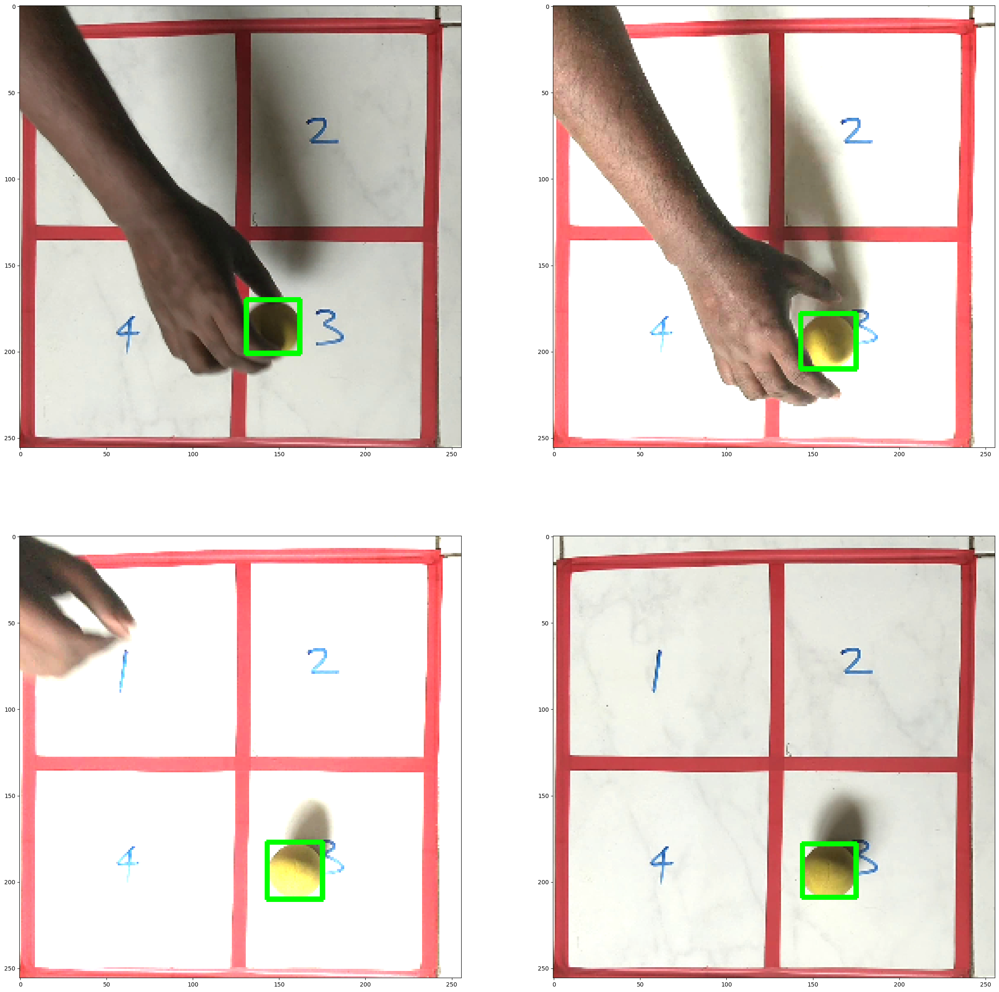

In [139]:
fig = plt.figure(figsize=(30,30))
for i in range(4):
    ax = fig.add_subplot(2,2,i+1)
    img = bright_img[i].copy()
    cv2.rectangle(img,(data["x_value"][i],data["y_value"][i]),(data["w_value"][i],data["h_value"][i]),(0,255,0),2)
    img = plt.imshow(img)

In [141]:
blur_img = []
kernel_size = (3, 3)
sigma = 0
for img in image_data:
    blurred_img = cv2.GaussianBlur(img, kernel_size, sigma)
    blur_img.append(blurred_img)

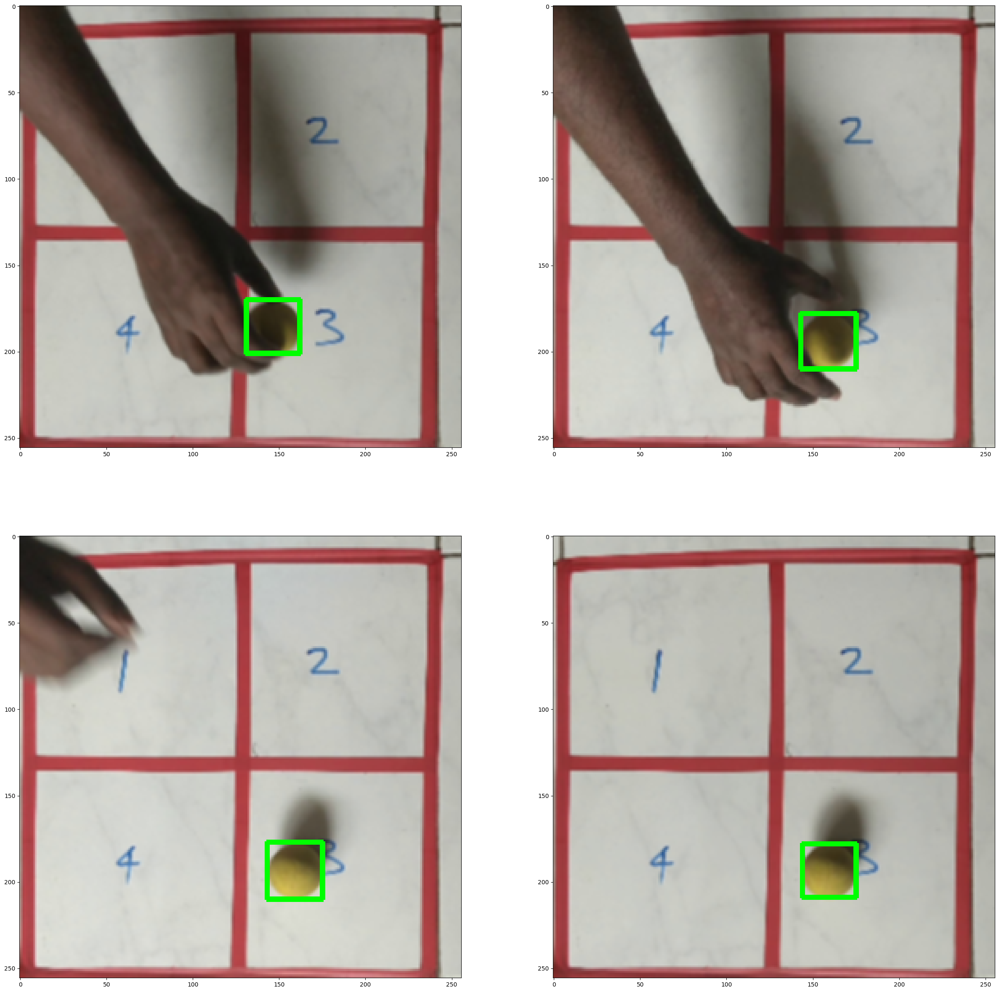

In [144]:
fig = plt.figure(figsize=(30,30))
for i in range(4):
    ax = fig.add_subplot(2,2,i+1)
    img = blur_img[i].copy()
    cv2.rectangle(img,(data["x_value"][i],data["y_value"][i]),(data["w_value"][i],data["h_value"][i]),(0,255,0),2)
    img = plt.imshow(img)

In [145]:
aug_labels = np.concatenate((data,aug_labels))

In [146]:
aug_labels.shape

(2960, 4)

In [148]:
np.save("aug_labels.npy",aug_labels)

In [150]:
image_data.extend(vertical_flip_img)

In [153]:
len(image_data)

1184

In [154]:
image_data.extend(horizontal_flip_img)

In [155]:
len(image_data)

1776

In [156]:
image_data.extend(bright_img)

In [157]:
len(image_data)

2368

In [158]:
image_data.extend(blur_img)

In [159]:
len(image_data)

2960

In [160]:
np.save("images_data.npy",image_data)

In [ ]:
# Load the dataset

In [26]:
image_data = np.load("/content/drive/MyDrive/Assignment_ball_track/img_label_npy/images_data.npy")

In [16]:
aug_labels = np.load("/content/drive/MyDrive/Assignment_ball_track/img_label_npy/aug_labels.npy")

In [4]:
image_data = np.asarray(image_data).astype("float32")

In [5]:
image_data = image_data/255.

In [6]:
image_data.shape

(2960, 256, 256, 3)

In [7]:
aug_labels = np.asarray(aug_labels).astype("float32")

In [13]:
del(image_data)
del(aug_labels)

In [8]:
from sklearn.model_selection import train_test_split

In [9]:
X_train,x_test,Y_train,y_test = train_test_split(image_data,aug_labels,test_size=0.2)

In [24]:
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, Y_train))

In [25]:
train_dataset.save("train_dataset")

In [26]:
test_dataset = tf.data.Dataset.from_tensor_slices((x_test, y_test))

In [27]:
test_dataset.save("test_dataset")

In [2]:
#load dataset
train_dataset = tf.data.Dataset.load("/content/drive/MyDrive/Assignment_ball_track/train_dataset")

In [13]:
tf.keras.backend.clear_session()

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import *
import matplotlib.pyplot as plt
from tensorflow.keras.initializers import he_uniform
from tensorflow.keras import Model

In [4]:
def res_block(X, filter, stage):
    # CONVOLUTIONAL BLOCK
    X_copy = X
    f1 , f2, f3 = filter
    # Main Path
    X = Conv2D(f1, (1,1), strides = (1,1), name ='res_'+str(stage)+'_conv_a', kernel_initializer= he_uniform())(X)
    X = MaxPool2D((2,2))(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_a')(X)
    X = Activation('relu')(X) 

    X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_conv_b', kernel_initializer= he_uniform())(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_b')(X)
    X = Activation('relu')(X) 

    X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_conv_c', kernel_initializer= he_uniform())(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_c')(X)

    # Short path
    X_copy = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_conv_copy', kernel_initializer= he_uniform())(X_copy)
    X_copy = MaxPool2D((2,2))(X_copy)
    X_copy = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_copy')(X_copy)

    # Add data from main and short paths
    X = Add()([X,X_copy])
    X = Activation('relu')(X)



    # IDENTITY BLOCK 1
    X_copy = X

    # Main Path
    X = Conv2D(f1, (1,1),strides = (1,1), name ='res_'+str(stage)+'_identity_1_a', kernel_initializer= he_uniform())(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_a')(X)
    X = Activation('relu')(X) 

    X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_identity_1_b', kernel_initializer= he_uniform())(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_b')(X)
    X = Activation('relu')(X) 

    X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_identity_1_c', kernel_initializer= he_uniform())(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_c')(X)

    # Add both paths together (Note that we feed the original input as is hence the name "identity")
    X = Add()([X,X_copy])
    X = Activation('relu')(X)



    # IDENTITY BLOCK 2
    X_copy = X

    # Main Path
    X = Conv2D(f1, (1,1),strides = (1,1), name ='res_'+str(stage)+'_identity_2_a', kernel_initializer= he_uniform())(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_a')(X)
    X = Activation('relu')(X) 

    X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_identity_2_b', kernel_initializer= he_uniform())(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_b')(X)
    X = Activation('relu')(X) 

    X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_identity_2_c', kernel_initializer= he_uniform())(X)
    X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_c')(X)

    # Add both paths together (Note that we feed the original input as is hence the name "identity")
    X = Add()([X,X_copy])
    X = Activation('relu')(X)

    return X

In [5]:
input_shape = (256,256,3)

# Input tensor shape
X_input = Input(input_shape)

# Zero-padding
X = ZeroPadding2D((3,3))(X_input)

# Stage #1
X = Conv2D(64, (7,7), strides= (2,2), name = 'conv1', kernel_initializer= he_uniform(seed = 0))(X)
X = BatchNormalization(axis =3, name = 'bn_conv1')(X)
X = Activation('relu')(X)
X = MaxPooling2D((3,3), strides= (2,2))(X)

# Stage #2
X = res_block(X, filter= [64,64,256], stage= 2)

# Stage #3
X = res_block(X, filter= [128,128,512], stage= 3)


# Average Pooling
X = AveragePooling2D((2,2), name = 'Averagea_Pooling')(X)

# Final layer
X = Flatten()(X)

X = Dense(4096, activation = 'relu')(X)
X = Dense(2048, activation = 'relu')(X)
X = Dense(4, activation = 'relu')(X)


model = Model( inputs= X_input, outputs = X)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1 (Conv2D)                 (None, 128, 128, 64  9472        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                              

In [8]:
from tensorflow.keras.optimizers import Adam

In [6]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.01,
    decay_steps=10000,
    decay_rate=0.9)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

In [9]:
model.compile(optimizer=Adam(learning_rate=lr_schedule),loss="mse",metrics=["mae"])

In [13]:
history = model.fit(train_dataset,epochs=30,batch_size=32)

Epoch 1/30


ValueError: ignored

In [ ]:
model.predict(x_test)

13/19 [===================>..........] - ETA: 0s

In [1]:
model.evaluate(x_test,y_test)

NameError: ignored